In [2]:
import pandas as pd
import numpy as np
from datetime import datetime
from matplotlib.dates import date2num
from numpy import array
from numpy import concatenate
from math import sqrt
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Dropout
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
import joblib
import os

Using TensorFlow backend.


In [3]:
# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return data[:-n_test], data[-n_test:]

In [4]:
def to_supervised(data, n_input, n_out=1):
    X, y = list(), list()
    in_start = 0
    # step over the entire history one time step at a time
    for _ in range(len(data)):
        # define the end of the input sequence
        in_end = in_start + n_input
        out_end = in_end + n_out
        # ensure we have enough data for this instance
        if out_end <= len(data):
            #X.append(data[in_start:in_end, :])
            #y.append(data[in_end:out_end, 0])
            X.append(data[in_start:in_end, :])
            y.append(data[in_end:out_end, 0])
        # move along one time step
        in_start += 1
    return array(X), array(y)

In [5]:
def model_fit(train, config, i):
    #config
    n_input, n_nodes, n_epochs, n_batch = config
    #data preparation
    train_x, train_y = to_supervised(train, n_input)    
    # reshape from [samples, timesteps] into [samples, timesteps, features]
    #train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], 1))
    train_x = train_x.reshape((train_x.shape[0], train_x.shape[1],1))
    n_features = 1
    # define model
    model = Sequential()
    model.add(LSTM(n_nodes, activation='relu', input_shape=(n_input, n_features)))
    model.add(Dense(n_nodes, activation='relu'))
#    model.add(Dropout(0.15)) 
    model.add(Dense(1)) 
    model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
    #model.compile(optimizer='adam', loss='mse')
    # fit model
    history = model.fit(train_x, train_y, epochs=n_epochs, batch_size=n_batch ,verbose=0, shuffle=False)

    # plot history
    plt.rcParams["figure.figsize"] = (5,3)
    plt.plot(history.history['loss'], label='train')
    #pyplot.plot(history.history['val_loss'], label='test')
    plt.legend()
    plt.show()
    #plt.savefig('loss'+ str(i)+'.png')
    return model

In [6]:
def model_predict(model, train, test, config):
    n_input,_,_,_= config
    #data test preparation   
    history = [x for x in train[-n_input:]]
#    test_x, test_y = to_supervised(history, n_input, n_out)
#    x_input = array(test_x[0]).reshape((1, n_input, 1))
    predictions = list()
    # forecast
    for i in range(len(test)):
        # predict the week
        yhat_sequence = forecast(model, history, n_input)
        # store the predictions
        predictions.append(yhat_sequence)
        # get real observation and add to history for predicting the next week
        history.append(test[i, :])
        #print("\rProcessing file {} ({}%)".format(i+1, 100*(i+1)//len(test)),sep=' ', end='', flush = True)
    predictions = array(predictions)    
    return predictions, test

In [7]:
# make a forecast
def forecast(model, history, n_input):
    data = array(history)
    # retrieve last observations for input data
    input_x = data[-n_input:,:]
    # reshape into [1, n_input, n]
    input_x = input_x.reshape((1, input_x.shape[0], input_x.shape[1]))
    # forecast the next week
    yhat = model.predict(input_x, verbose=0)
    # we only want the vector forecast
    yhat = yhat[0]
    return yhat

In [8]:
def models_generator2(configs, train, test, pred_index):
    for i in range(len(configs)):
        
        config = configs[i]
        filename = 'config' + str(i) + '.model'
        
        ##save/load checkpoint
        print( str(i) + "\nFitting config "+ str(config))
        model = model_fit(train, config,i)
        joblib.dump(model, filename)

        loaded_model = joblib.load(filename)

        #forecast
        predictions, real = model_predict(loaded_model, train, test , config)
        
        #invert scaling prediction
#        predictions = scaler.inverse_transform(predictions_inv)
        #saving predictions
        prediction = pd.DataFrame(predictions, index = pred_index, columns=['predictions']).to_csv('predictions' + str(i) +'.csv')
        
        #inverser for metrics 
#        test1 = scaler.inverse_transform(test)
        mse = mean_squared_error(test, predictions)
        print("mse = "+ str(sqrt(mse)) + "\n\n")

    #data set inverse
    #train = scaler.inverse_transform(train)
    #test = scaler.inverse_transform(test)

    #invert scaling actual
    #real_inv = real_inv.reshape((len(real_inv), 1))
    #real = scaler.inverse_transform(real_inv)
   
    
    #plotting predictions
    #prediction_plotter(predictions, i)
    
    return

# Tides

In [9]:
#load dataset, Time(UTC),prs(m),rad(m)
df = pd.read_csv('data/data2y.csv',sep=',', header=0, index_col=0, squeeze=True, parse_dates=True)

In [10]:
df.head()

,prs(m),rad(m)
Time(UTC),,
2016-12-31 00:00:52,2.369,2.955
2016-12-31 00:01:53,2.36,2.967
2016-12-31 00:02:52,2.369,2.958
2016-12-31 00:03:53,2.361,2.949
2016-12-31 00:04:53,2.392,2.965


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1036988 entries, 2016-12-31 00:00:52 to 2018-12-30 23:59:19
Data columns (total 2 columns):
prs(m)    1036988 non-null object
rad(m)    1008766 non-null object
dtypes: object(2)
memory usage: 23.7+ MB


In [12]:
df.describe()

,prs(m),rad(m)
count,1036988,1008766
unique,2191,3638
top,2.026,
freq,1003,3557


In [13]:
#non-null object to float64
df['prs(m)'] = pd.to_numeric(df['prs(m)'], errors='coerce')
df['rad(m)'] = pd.to_numeric(df['rad(m)'], errors='coerce')

In [14]:
df.describe()

,prs(m),rad(m)
count,1.036833e+06,1.005209e+06
mean,2.308207e+00,3.409635e+00
std,3.803411e-01,5.254156e-01
min,-3.000000e-03,-3.540000e+00
25%,2.006000e+00,3.095000e+00
50%,2.294000e+00,3.403000e+00
75%,2.594000e+00,3.766000e+00
max,3.620000e+00,3.200000e+01


In [15]:
60*12

720

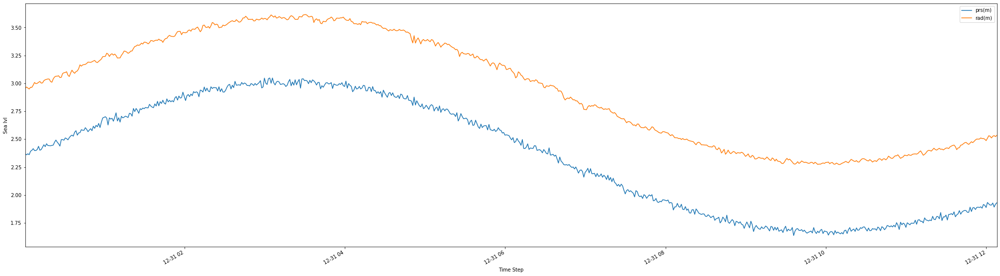

In [16]:
%matplotlib inline
plt.rcParams["figure.figsize"] = (35,10)
df[:720].plot()
#plt.plot(df[:480], marker='.', label="data")
plt.ylabel('Sea lvl')
plt.xlabel('Time Step')
plt.legend()
plt.show();

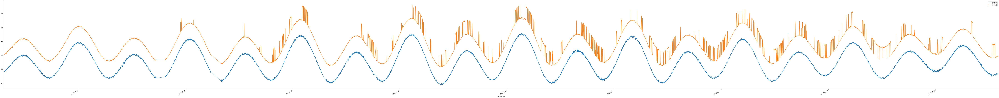

In [17]:
plt.rcParams["figure.figsize"] = (100,10)
df[1440*9:1440*9*2].plot()
plt.tight_layout()
#pyplot.ylim(1, 5)
plt.show()

In [18]:
#prs(m) looks more stable
df.drop(df.columns[[1]], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1036988 entries, 2016-12-31 00:00:52 to 2018-12-30 23:59:19
Data columns (total 1 columns):
prs(m)    1036833 non-null float64
dtypes: float64(1)
memory usage: 15.8 MB


In [19]:
#NaNs ?
null_columns=df.columns[df.isnull().any()]
df[null_columns].isnull().sum()

prs(m)    155
dtype: int64

In [20]:
print(df[df.isnull().any(axis=1)][null_columns])

                     prs(m)
Time(UTC)                  
2017-06-17 22:08:17     NaN
2017-06-17 22:09:17     NaN
2017-06-17 22:10:17     NaN
2017-06-17 22:11:17     NaN
2017-07-18 19:45:17     NaN
...                     ...
2018-10-16 13:12:17     NaN
2018-10-16 13:13:17     NaN
2018-10-16 13:14:17     NaN
2018-10-16 13:15:17     NaN
2018-10-16 13:16:17     NaN

[155 rows x 1 columns]


In [21]:
df.loc['2017-06-17 22:08:17']

prs(m)   NaN
Name: 2017-06-17 22:08:17, dtype: float64

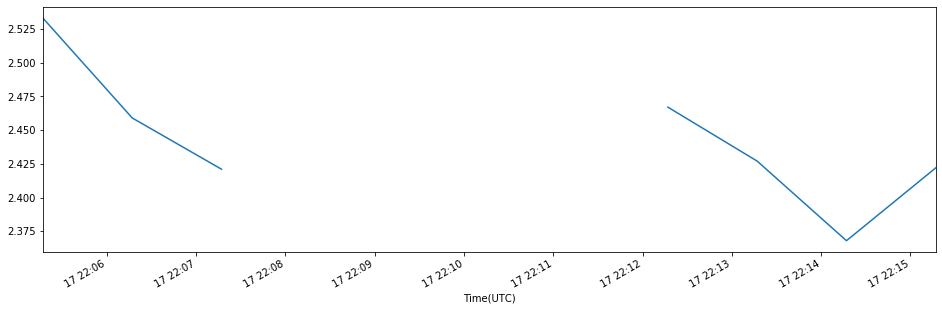

In [22]:
plt.rcParams["figure.figsize"] = (16,5)
df.loc['2017-06-17 22:05':'2017-06-17 22:15',"prs(m)"].plot()
plt.show()

In [23]:
df = df.interpolate()

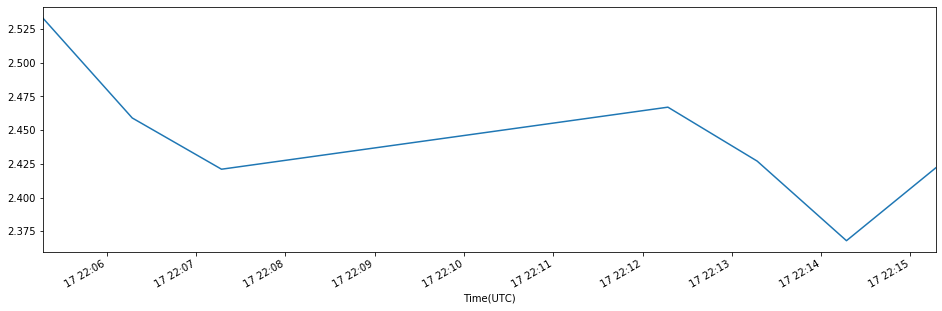

In [24]:
plt.rcParams["figure.figsize"] = (16,5)
df.loc['2017-06-17 22:05':'2017-06-17 22:15',"prs(m)"].plot()
plt.show()

# U/T tides data

In [25]:
# 8 hours for prediction work
unknown = 60*8
r = df[:-unknown]
p = df[-unknown:]

In [26]:
# 1 month for NN training
m = 60*24 * 30
r_1m = r[-m:]

In [27]:
r.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1036508 entries, 2016-12-31 00:00:52 to 2018-12-30 15:59:17
Data columns (total 1 columns):
prs(m)    1036508 non-null float64
dtypes: float64(1)
memory usage: 15.8 MB


In [28]:
r_1m.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43200 entries, 2018-11-29 06:37:18 to 2018-12-30 15:59:17
Data columns (total 1 columns):
prs(m)    43200 non-null float64
dtypes: float64(1)
memory usage: 675.0 KB


In [29]:
p.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 480 entries, 2018-12-30 16:00:17 to 2018-12-30 23:59:19
Data columns (total 1 columns):
prs(m)    480 non-null float64
dtypes: float64(1)
memory usage: 7.5 KB


In [30]:
#getting real dates
rdates = date2num(r.index.to_pydatetime())
#getting unknown dates
pdates = date2num(p.index.to_pydatetime())
#getting all dates
dates = date2num(df.index.to_pydatetime())

In [31]:
#Sampling interval in hours, default = 1.
dt = 1/60
#The start time of the series, in matplotlib_datenum format (default empty).
stime = r.index[0]
lat = -33.02730833

In [32]:
rmean = np.mean(r.values)
rmean

2.308057430815778

## Nivel medio del mar

In [55]:
serie = r['prs(m)']
serie = serie - np.mean(r.values)
serie

Time(UTC)
2016-12-31 00:00:52    0.060943
2016-12-31 00:01:53    0.051943
2016-12-31 00:02:52    0.060943
2016-12-31 00:03:53    0.052943
2016-12-31 00:04:53    0.083943
                         ...   
2018-12-30 15:55:17   -0.543057
2018-12-30 15:56:17   -0.543057
2018-12-30 15:57:17   -0.538057
2018-12-30 15:58:17   -0.611057
2018-12-30 15:59:17   -0.556057
Name: prs(m), Length: 1036508, dtype: float64

# t_tides

In [35]:
import ttide
print(ttide.__version__)

0.3lfk


In [56]:
out = ttide.t_tide(serie, dt, stime, lat)

C:\Users\sergi\Anaconda3\lib\site-packages\ttide-0.3_exp-py3.7.egg\ttide\t_tide.py:345: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  coef = np.linalg.lstsq(lhs, rhs)[0].T
C:\Users\sergi\Anaconda3\lib\site-packages\numpy\lib\type_check.py:161: FutureWarning: `real` is deprecated and will be removed in a future version. To eliminate this warning for a Series `ser`, use `np.real(ser.to_numpy())` or `ser.to_numpy().real`.
  return val.real
C:\Users\sergi\Anaconda3\lib\site-packages\numpy\lib\type_check.py:204: FutureWarning: `imag` is deprecated and will be removed in a future version. To eliminate this warning for a Series `ser`, use `np.imag(ser.to_numpy())` or `ser.to_numpy().imag`.
  return val.imag


-----------------------------------
nobs = 1036508 
ngood = 1036507 
record length (days) = 719.80
start time: 2016-12-31 00:00:52
rayleigh criterion = 1.0

Greenwich phase computed with nodal
                   corrections applied to amplitude
                   and phase relative to center time

x0= 0.000476  xtrend= 0
var(data)= 0.14    var(prediction)= 0.02    var(residual)= 0.12
var(prediction)/var(data) (%) = 15.9

        tidal amplitude and phase with 95 % CI estimates
 tide      freq        amp      amp_err   pha      pha_err    snr
* SA    0.0001141     0.0464     0.020    244.09     21.85       5.4
* SSA   0.0002282     0.0490     0.019    200.23     22.85       6.7
  MSM   0.0013098     0.0020     0.012    345.83    213.99     0.027
  MM    0.0015122     0.0091     0.016    233.50    119.13      0.32
  MSF   0.0028219     0.0019     0.015    338.07    240.06     0.016
  MF    0.0030501     0.0030     0.013    145.68    203.84      0.05
  ALP1  0.0343966     0.0005     0.018

C:\Users\sergi\Anaconda3\lib\site-packages\ttide-0.3_exp-py3.7.egg\ttide\t_utils.py:447: FutureWarning: `real` is deprecated and will be removed in a future version. To eliminate this warning for a Series `ser`, use `np.real(ser.to_numpy())` or `ser.to_numpy().real`.
  x = np.var(out['xingd'].real, ddof=1)
C:\Users\sergi\Anaconda3\lib\site-packages\ttide-0.3_exp-py3.7.egg\ttide\t_utils.py:449: FutureWarning: `real` is deprecated and will be removed in a future version. To eliminate this warning for a Series `ser`, use `np.real(ser.to_numpy())` or `ser.to_numpy().real`.
  xr = np.var(out['xresgd'].real, ddof=1)


In [57]:
out.keys()

dict_keys(['nobs', 'ngood', 'dt', 'xin', 'xout', 'xres', 'xingd', 'xoutgd', 'xresgd', 'isComplex', 'ray', 'nodcor', 'z0', 'dz0', 'fu', 'nameu', 'tidecon', 'snr', 'synth', 'lat', 'ltype', 'stime'])

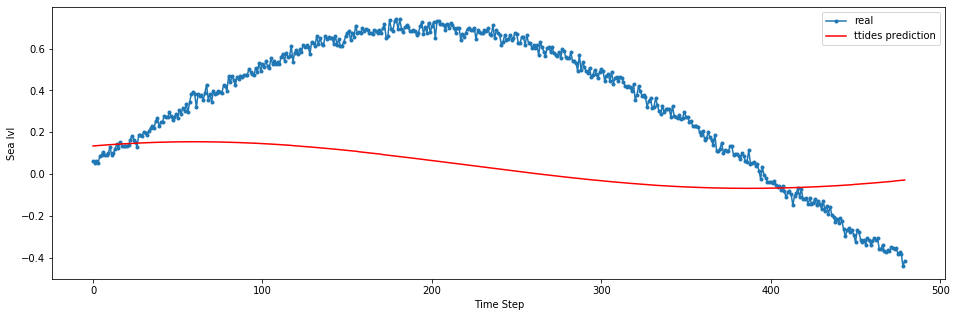

In [58]:
#prediction w/ 2y dates
t_tides_r = ttide.t_predic(rdates, out.get("nameu"), out.get("fu"), out.get("tidecon"), lat)

plt.plot(serie.values[:480], marker='.', label="real")
plt.plot(t_tides_r[:480], 'r', label="ttides prediction")
plt.ylabel('Sea lvl')
plt.xlabel('Time Step')
plt.legend()
plt.show();

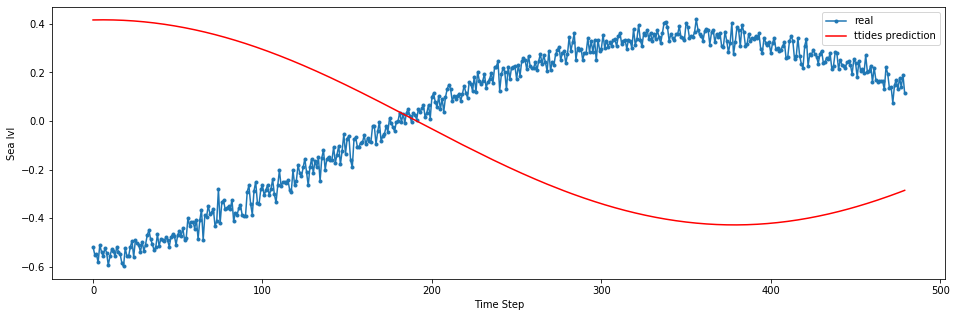

In [59]:
#prediction w/ 1m dates
t_tides_p = ttide.t_predic(pdates, out.get("nameu"), out.get("fu"), out.get("tidecon"), lat)

plt.plot(p.values[:480] - rmean, marker='.', label="real")
plt.plot(t_tides_p[:480], 'r', label="ttides prediction")
plt.ylabel('Sea lvl')
plt.xlabel('Time Step')
plt.legend()
plt.show();

## U_tides

In [60]:
import utide
import matplotlib.dates as mdates
print(utide.__version__)

0.2.5


In [61]:
utcoef = utide.solve(rdates, serie, lat=lat)
#solve: matrix prep ... solution ... diagnostics ... done.

solve: matrix prep ... solution ... diagnostics ... done.


In [62]:
utcoef.keys()

dict_keys(['name', 'aux', 'nR', 'nNR', 'nI', 'weights', 'A', 'g', 'mean', 'slope', 'g_ci', 'A_ci', 'diagn'])

prep/calcs ... done.


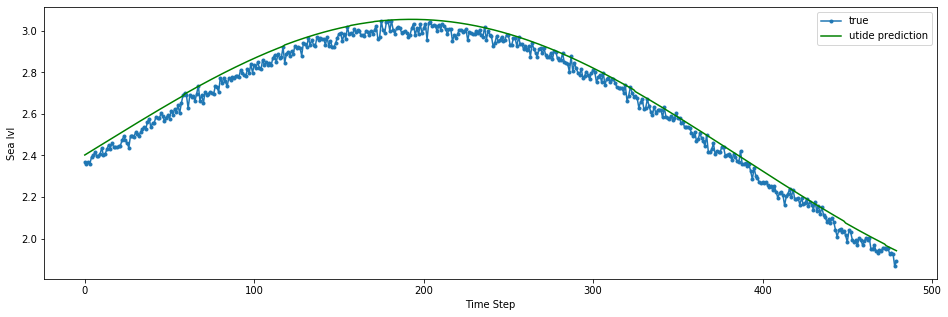

In [63]:
ut_recr = utide.reconstruct(rdates, utcoef)
#prep/calcs ... done.

plt.plot(r.values[:480], marker='.', label="true")
plt.plot(ut_recr["h"][:480] + np.mean(r.values), 'g', label="utide prediction")
plt.ylabel('Sea lvl')
plt.xlabel('Time Step')
plt.legend()
plt.show();

In [ ]:
#test data reconstruct
ut_recp = utide.reconstruct(pdates, utcoef)
#prep/calcs ... done.

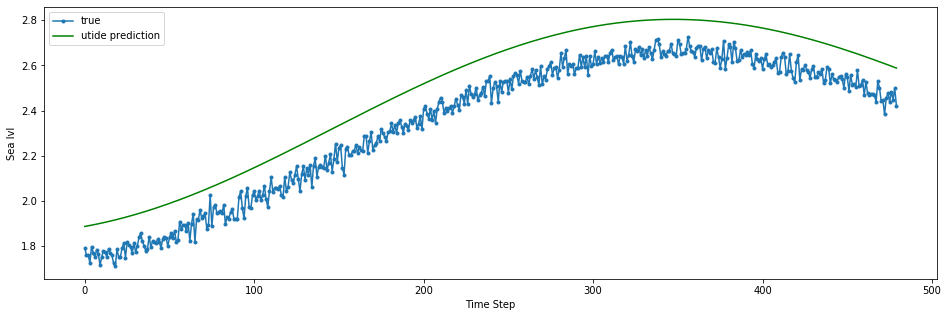

In [70]:
plt.plot(p.values[:480], marker='.', label="true")
plt.plot(ut_recp["h"][:480] + rmean, 'g', label="utide prediction")
plt.ylabel('Sea lvl')
plt.xlabel('Time Step')
plt.legend()
plt.show();

In [66]:
ut_recr.keys()

dict_keys(['t_in', 'epoch', 'constit', 'min_SNR', 'min_PE', 't_mpl', 'h'])

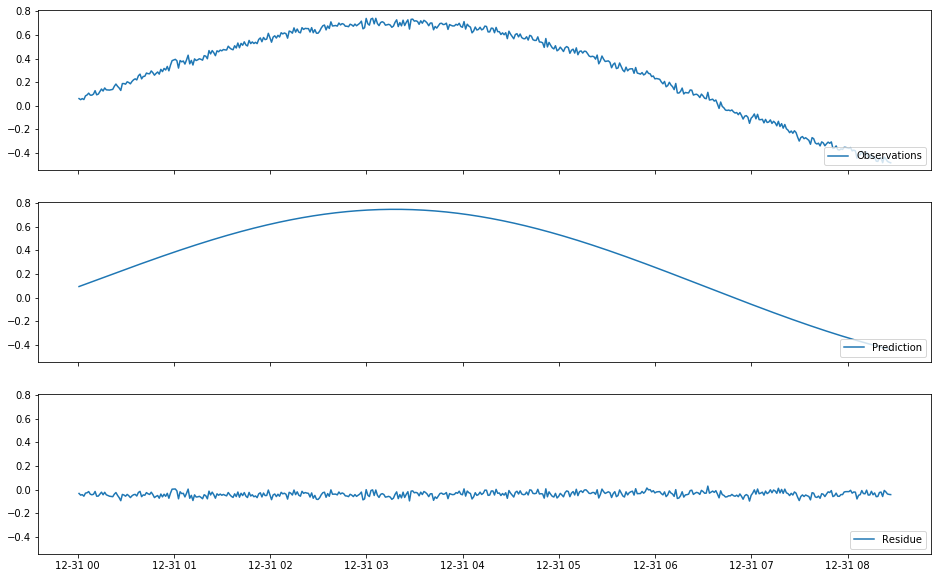

In [67]:
dates = r.index[:500]
obs = serie[:500]
xout = ut_recr.get("h")[:500].squeeze()
res = obs - xout

fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, sharey=True, sharex=True, figsize=(16, 10))

ax0.plot(dates, obs, label=u'Observations')
ax0.legend(numpoints=1, loc='lower right')

ax1.plot(dates, xout, label=u'Prediction')
ax1.legend(numpoints=1, loc='lower right')

ax2.plot(dates, res , label=u'Residue')
_ = ax2.legend(numpoints=1, loc='lower right')

# LSTM data prep

solve: matrix prep ... solution ... diagnostics ... done.
prep/calcs ... done.


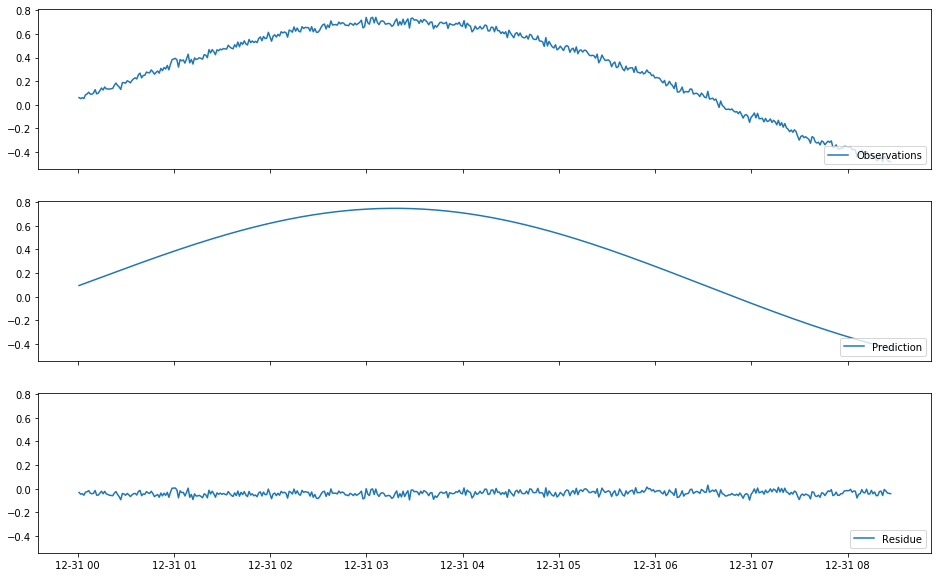

In [36]:
#all data residue
serie = df['prs(m)']
serie = serie - np.mean(df.values)

#utcoef = utide.solve(dates, serie, lat=lat)
#ut_rec = utide.reconstruct(dates, utcoef)

dates = df.index[:500]
obs = serie[:500]
xout = ut_rec.get("h")[:500].squeeze()
res = obs - xout

fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, sharey=True, sharex=True, figsize=(16, 10))

ax0.plot(dates, obs, label=u'Observations')
ax0.legend(numpoints=1, loc='lower right')

ax1.plot(dates, xout, label=u'Prediction')
ax1.legend(numpoints=1, loc='lower right')

ax2.plot(dates, res , label=u'Residue')
_ = ax2.legend(numpoints=1, loc='lower right')
#solve: matrix prep ... solution ... diagnostics ... done.
#prep/calcs ... done.

## UT Residue and pred to .csv

In [ ]:
res = serie - ut_rec.get("h").squeeze()
dfres = pd.DataFrame(data = res)
dfres.rename(columns={'prs(m)':'residue'},inplace=True)

UTxout = ut_rec.get("h").squeeze()
UTxoutdf = pd.DataFrame(data = UTxout, index = dfres.index, columns=["UTxout"])

### To .csv

In [ ]:
UTxoutdf.to_csv('data/pred2y_utide.csv', index = True)
dfres.to_csv('data/res2y_utide.csv', index = True)

### From .csv

In [91]:
utp = pd.read_csv('data/pred2y_utide.csv',sep=',', header=0, index_col=0, squeeze=True, parse_dates=True)
utres = pd.read_csv('data/res2y_utide.csv',sep=',', header=0, index_col=0, squeeze=True, parse_dates=True)

In [92]:
utres.shape

(1036988,)

In [93]:
utp = utp.to_frame()
utres = utres.to_frame()

In [94]:
utres.shape

(1036988, 1)

# LSTMN TIME

In [128]:
# create a list of configs to try
def model_configs():
    # define scope of configs
    n_input = [2,3]
    n_nodes = [2,3]
    n_epochs = [5,10,20]
    n_batch = [200,300]
    # create configs
    configs = list()
    for i in n_input:
        for j in n_nodes:
            for k in n_epochs:
                for l in n_batch:
                    cfg = [i, j, k, l]
                    configs.append(cfg)
    print('Total configs: %d' % len(configs))
    return configs

In [129]:
configs_lst = model_configs()

Total configs: 24


# NN Data

In [97]:
# 1 month+3 for NN training
m = 60*24* 33
utres = utres[-m:]

In [98]:
# utide prediction mirror 
utp = utp[-m:]
utp.shape

(47520, 1)

In [99]:
utres.shape

(47520, 1)

In [100]:
train , test = train_test_split(utres.values, 480)
print(len(train), len(test))
#timesteps for predictions
pred_index= utres.index[-480:]
print("Forecasting "+ str(len(test)/60) + " hrs -> "+ str(len(test)))

47040 480
Forecasting 8.0 hrs -> 480


In [101]:
# utide prediction mirror 
_ , utptest = train_test_split(utp.values, 480)
len(utptest)

480

In [102]:
test.shape

(480, 1)

0
Fitting config [2, 2, 5, 100]


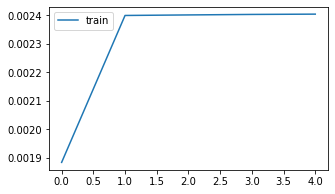

mse = 0.031893958077379506


1
Fitting config [2, 2, 5, 200]


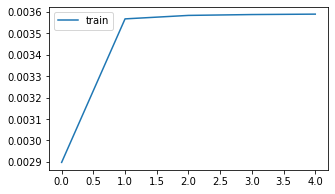

mse = 0.033127802300378935


2
Fitting config [2, 2, 5, 500]


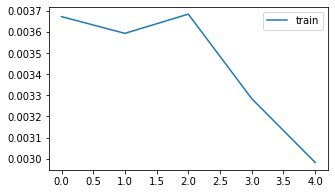

mse = 0.03146047732625316


3
Fitting config [2, 2, 5, 1440]


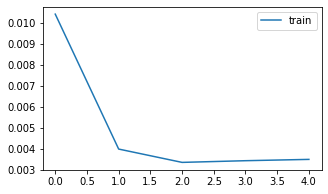

mse = 0.04317959386263944


4
Fitting config [2, 2, 10, 100]


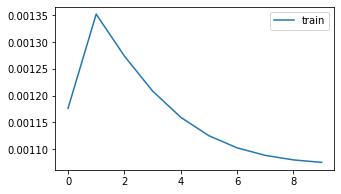

mse = 0.03502683273331763


5
Fitting config [2, 2, 10, 200]


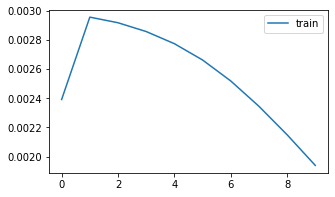

mse = 0.03341890307728747


6
Fitting config [2, 2, 10, 500]


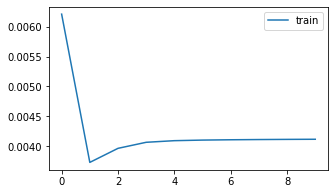

mse = 0.03901019858485059


7
Fitting config [2, 2, 10, 1440]


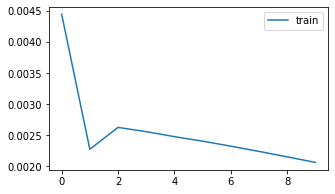

mse = 0.03564303326490659


8
Fitting config [2, 2, 20, 100]


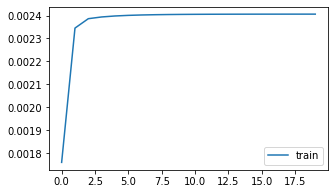

mse = 0.03191885468414378


9
Fitting config [2, 2, 20, 200]


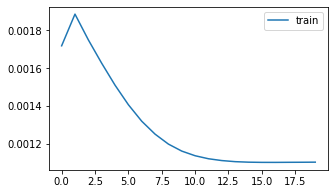

mse = 0.03585616939859699


10
Fitting config [2, 2, 20, 500]


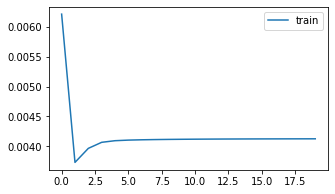

mse = 0.038908636748508266


11
Fitting config [2, 2, 20, 1440]


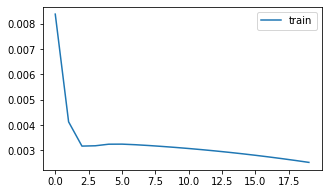

mse = 0.03765798643675368


12
Fitting config [2, 3, 5, 100]


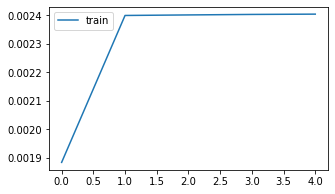

mse = 0.03189396226035687


13
Fitting config [2, 3, 5, 200]


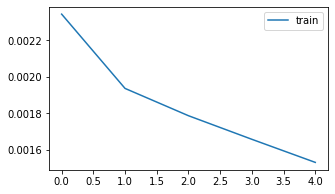

mse = 0.032035693022209925


14
Fitting config [2, 3, 5, 500]


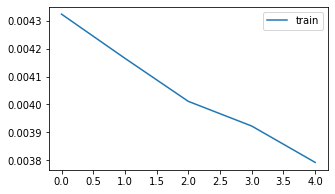

mse = 0.03286680305582464


15
Fitting config [2, 3, 5, 1440]


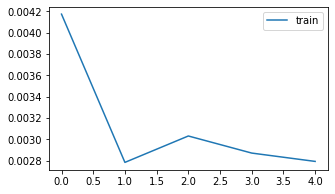

mse = 0.036060116081914666


16
Fitting config [2, 3, 10, 100]


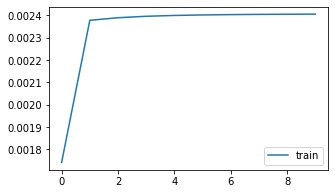

mse = 0.03191454423672918


17
Fitting config [2, 3, 10, 200]


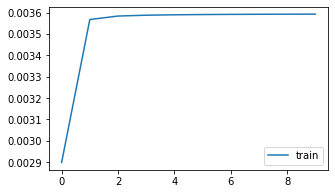

mse = 0.03311972471325095


18
Fitting config [2, 3, 10, 500]


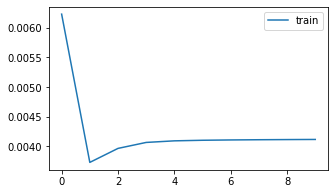

mse = 0.039009214890630764


19
Fitting config [2, 3, 10, 1440]


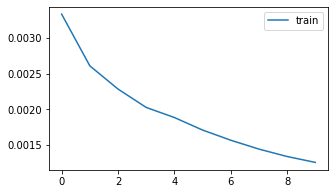

mse = 0.035872089744726395


20
Fitting config [2, 3, 20, 100]


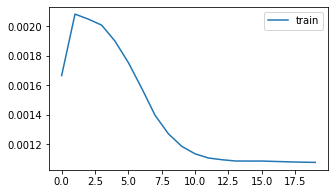

mse = 0.03675134666719155


21
Fitting config [2, 3, 20, 200]


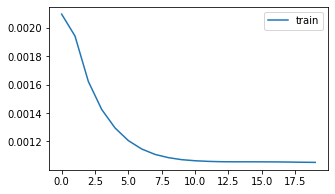

mse = 0.03405711243951939


22
Fitting config [2, 3, 20, 500]


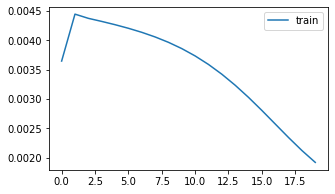

mse = 0.03498702245407126


23
Fitting config [2, 3, 20, 1440]


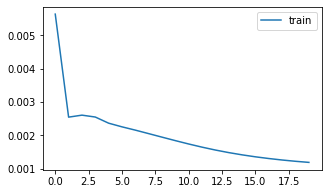

mse = 0.03652176991310206


24
Fitting config [2, 4, 5, 100]


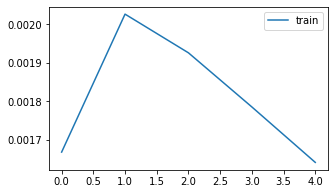

mse = 0.03362067788602704


25
Fitting config [2, 4, 5, 200]


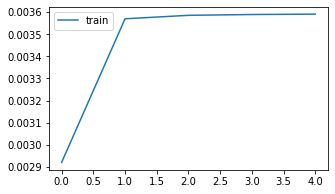

mse = 0.03312885055545581


26
Fitting config [2, 4, 5, 500]


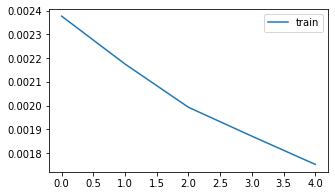

mse = 0.03725496045952144


27
Fitting config [2, 4, 5, 1440]


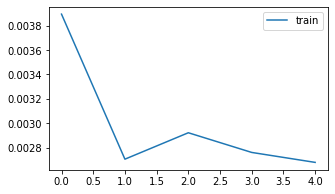

mse = 0.035754289297925346


28
Fitting config [2, 4, 10, 100]


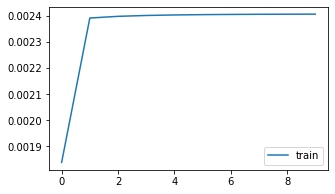

mse = 0.03191580462499697


29
Fitting config [2, 4, 10, 200]


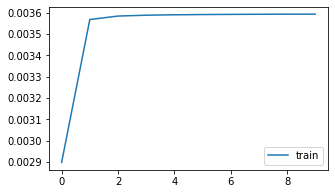

mse = 0.0331196905830268


30
Fitting config [2, 4, 10, 500]


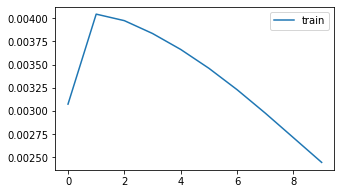

mse = 0.03364898609507349


31
Fitting config [2, 4, 10, 1440]


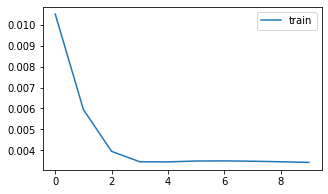

mse = 0.04231067324658976


32
Fitting config [2, 4, 20, 100]


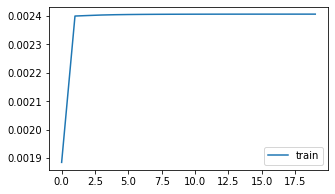

mse = 0.03191890533575153


33
Fitting config [2, 4, 20, 200]


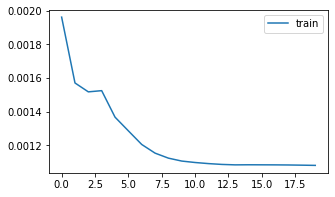

mse = 0.033011690024606306


34
Fitting config [2, 4, 20, 500]


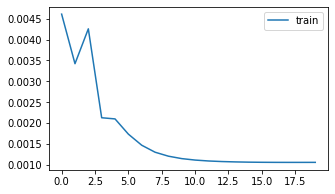

mse = 0.03536502198737517


35
Fitting config [2, 4, 20, 1440]


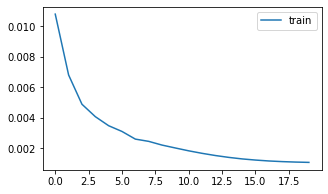

mse = 0.034279393069474286


36
Fitting config [3, 2, 5, 100]


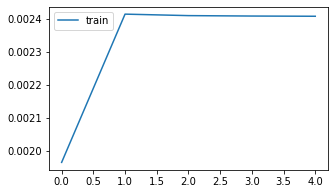

mse = 0.03190089806806883


37
Fitting config [3, 2, 5, 200]


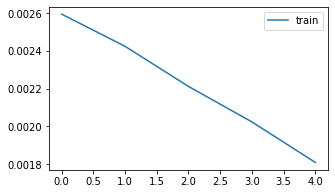

mse = 0.032374925443109895


38
Fitting config [3, 2, 5, 500]


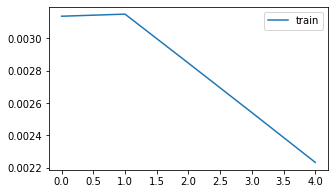

mse = 0.0323976656955842


39
Fitting config [3, 2, 5, 1440]


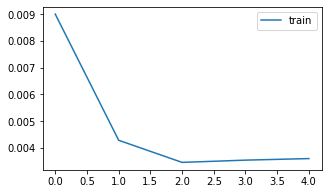

mse = 0.04281876856814073


40
Fitting config [3, 2, 10, 100]


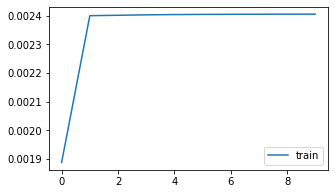

mse = 0.03191533243928823


41
Fitting config [3, 2, 10, 200]


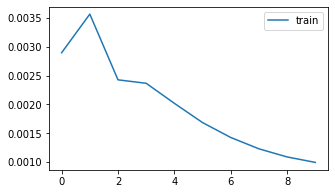

mse = 0.03234692638075942


42
Fitting config [3, 2, 10, 500]


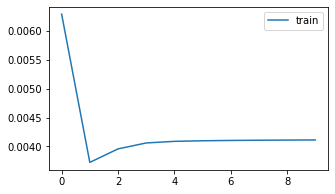

mse = 0.039017930973816325


43
Fitting config [3, 2, 10, 1440]


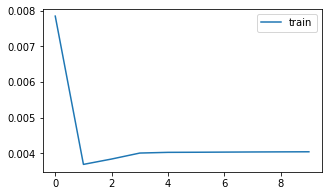

mse = 0.04383252881913883


44
Fitting config [3, 2, 20, 100]


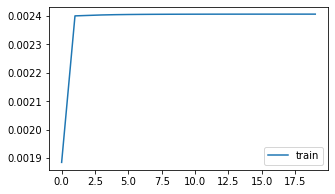

mse = 0.031917719485767694


45
Fitting config [3, 2, 20, 200]


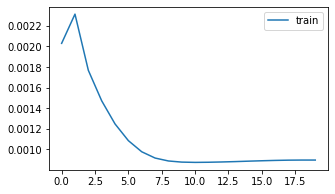

mse = 0.032817230476907946


46
Fitting config [3, 2, 20, 500]


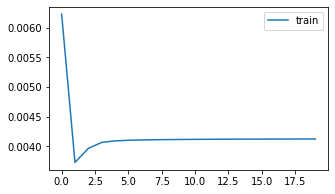

mse = 0.03891134110782596


47
Fitting config [3, 2, 20, 1440]


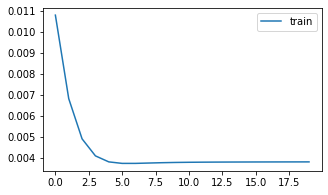

mse = 0.04662184399006766


48
Fitting config [3, 3, 5, 100]


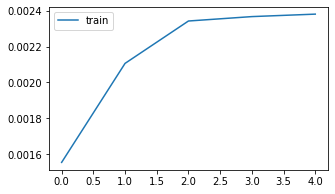

mse = 0.03183019203785366


49
Fitting config [3, 3, 5, 200]


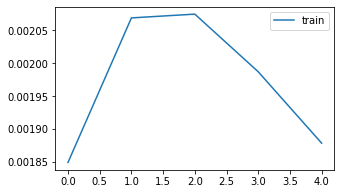

mse = 0.03145131980054106


50
Fitting config [3, 3, 5, 500]


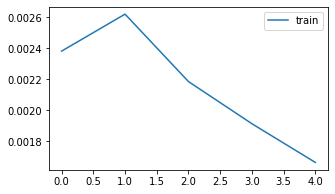

mse = 0.03441955565924807


51
Fitting config [3, 3, 5, 1440]


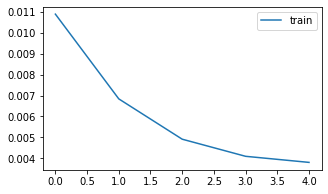

mse = 0.056189227828763094


52
Fitting config [3, 3, 10, 100]


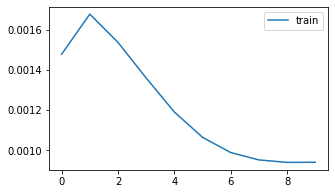

mse = 0.03632145596975128


53
Fitting config [3, 3, 10, 200]


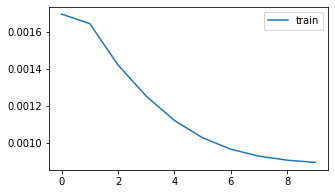

mse = 0.0332190293235598


54
Fitting config [3, 3, 10, 500]


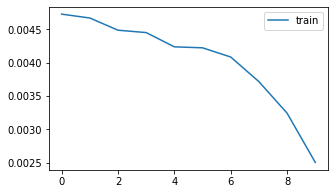

mse = 0.031211743089785943


55
Fitting config [3, 3, 10, 1440]


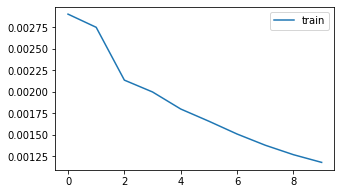

mse = 0.03412805419257206


56
Fitting config [3, 3, 20, 100]


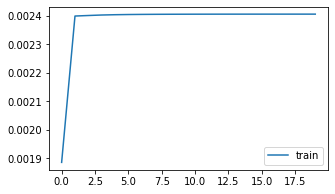

mse = 0.03191771526656322


57
Fitting config [3, 3, 20, 200]


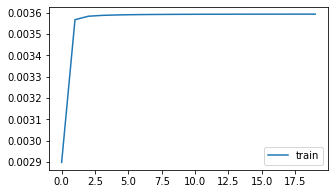

mse = 0.033117921782076544


58
Fitting config [3, 3, 20, 500]


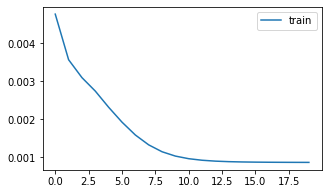

mse = 0.034311764208177116


59
Fitting config [3, 3, 20, 1440]


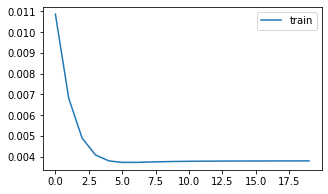

mse = 0.046622535200865706


60
Fitting config [3, 4, 5, 100]


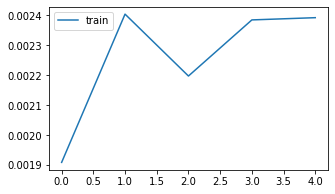

mse = 0.0318614600472453


61
Fitting config [3, 4, 5, 200]


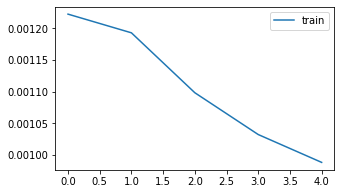

mse = 0.03382378284429174


62
Fitting config [3, 4, 5, 500]


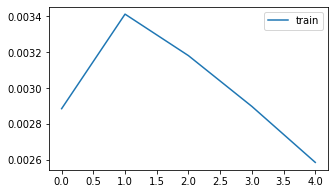

mse = 0.0321808506752612


63
Fitting config [3, 4, 5, 1440]


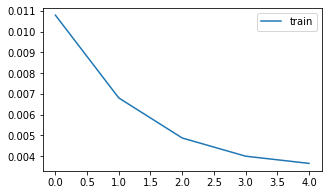

mse = 0.05540392527625012


64
Fitting config [3, 4, 10, 100]


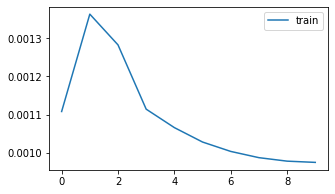

mse = 0.03555227709298052


65
Fitting config [3, 4, 10, 200]


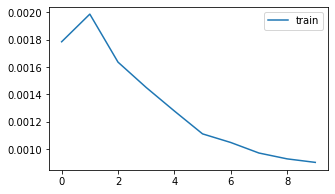

mse = 0.03368352101580752


66
Fitting config [3, 4, 10, 500]


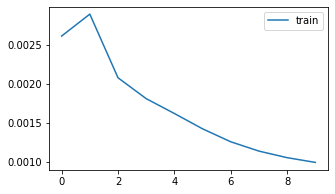

mse = 0.03403965935302896


67
Fitting config [3, 4, 10, 1440]


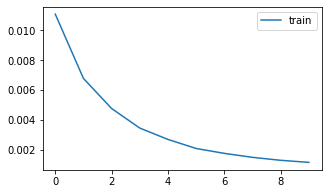

mse = 0.03332663096161253


68
Fitting config [3, 4, 20, 100]


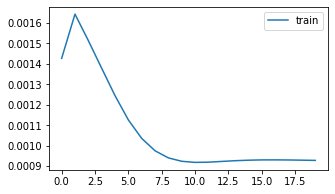

mse = 0.035311345849721926


69
Fitting config [3, 4, 20, 200]


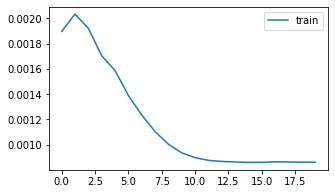

mse = 0.033289953623630214


70
Fitting config [3, 4, 20, 500]


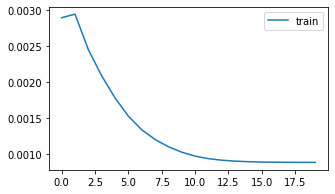

mse = 0.03402589770055501


71
Fitting config [3, 4, 20, 1440]


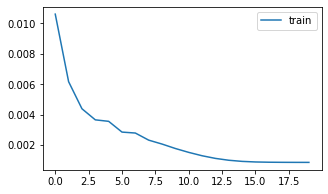

mse = 0.03408399685969349


72
Fitting config [4, 2, 5, 100]


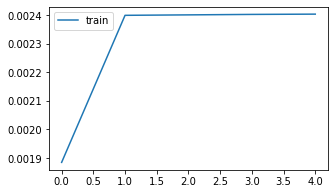

mse = 0.0318911611029737


73
Fitting config [4, 2, 5, 200]


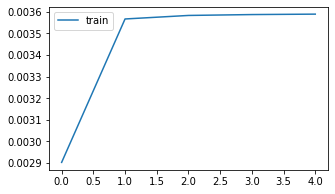

mse = 0.03312677132546628


74
Fitting config [4, 2, 5, 500]


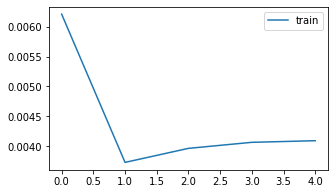

mse = 0.03925816392724331


75
Fitting config [4, 2, 5, 1440]


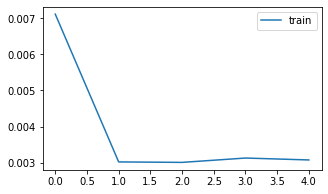

mse = 0.03877385584984901


76
Fitting config [4, 2, 10, 100]


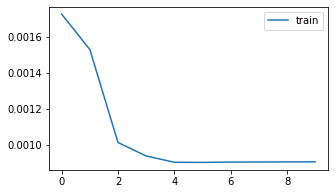

mse = 0.034208876350261666


77
Fitting config [4, 2, 10, 200]


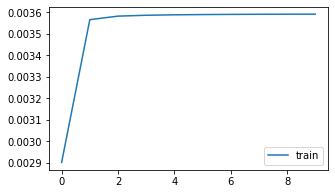

mse = 0.03311887151950385


78
Fitting config [4, 2, 10, 500]


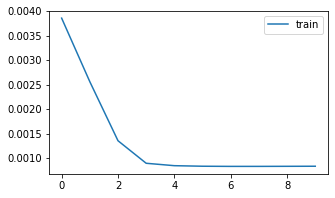

mse = 0.03301954791218705


79
Fitting config [4, 2, 10, 1440]


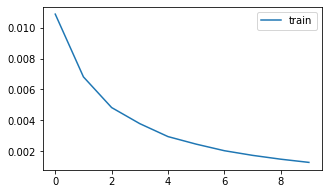

mse = 0.03374634266647988


80
Fitting config [4, 2, 20, 100]


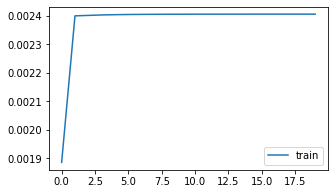

mse = 0.03191576667853598


81
Fitting config [4, 2, 20, 200]


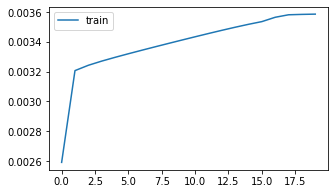

mse = 0.03310153420187363


82
Fitting config [4, 2, 20, 500]


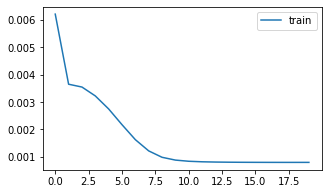

mse = 0.033055947591936266


83
Fitting config [4, 2, 20, 1440]


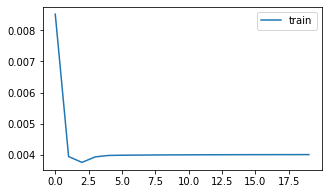

mse = 0.044249441297650675


84
Fitting config [4, 3, 5, 100]


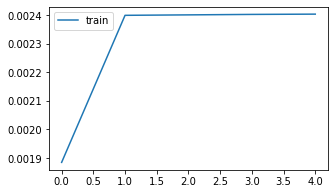

mse = 0.0318911611029737


85
Fitting config [4, 3, 5, 200]


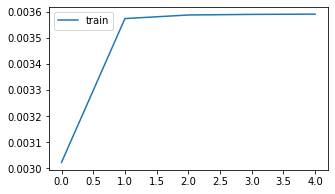

mse = 0.03313184826620016


86
Fitting config [4, 3, 5, 500]


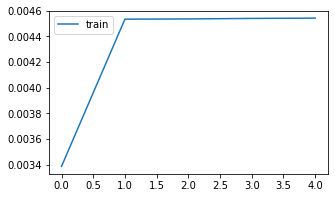

mse = 0.031376833254268044


87
Fitting config [4, 3, 5, 1440]


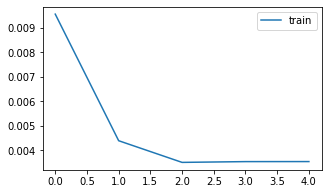

mse = 0.04319524858273894


88
Fitting config [4, 3, 10, 100]


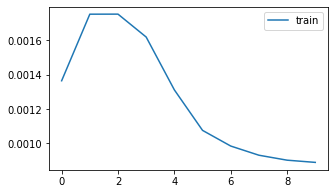

mse = 0.03470308989733625


89
Fitting config [4, 3, 10, 200]


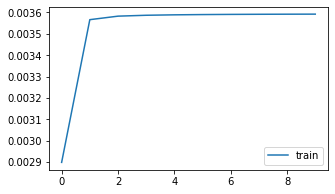

mse = 0.03311886014445782


90
Fitting config [4, 3, 10, 500]


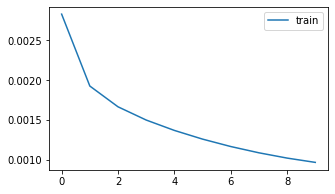

mse = 0.03296345098127729


91
Fitting config [4, 3, 10, 1440]


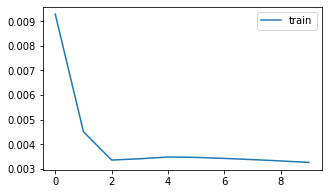

mse = 0.039750892607403436


92
Fitting config [4, 3, 20, 100]


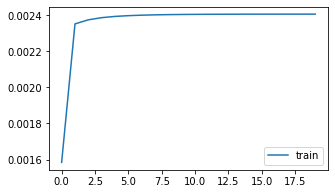

mse = 0.031915648626194885


93
Fitting config [4, 3, 20, 200]


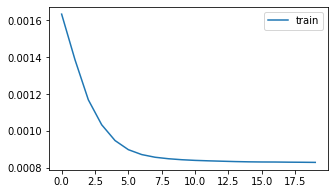

mse = 0.03226967378377351


94
Fitting config [4, 3, 20, 500]


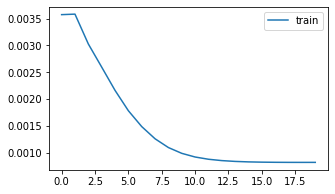

mse = 0.03316849250682129


95
Fitting config [4, 3, 20, 1440]


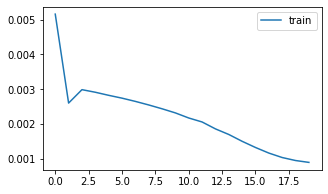

KeyboardInterrupt: 

<Figure size 360x216 with 0 Axes>

In [103]:
#models_generator2(configs_lst, train, test, pred_index)

0 [2, 2, 5, 200]


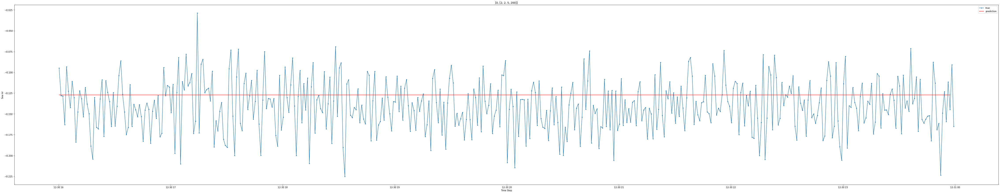

1 [2, 2, 5, 300]


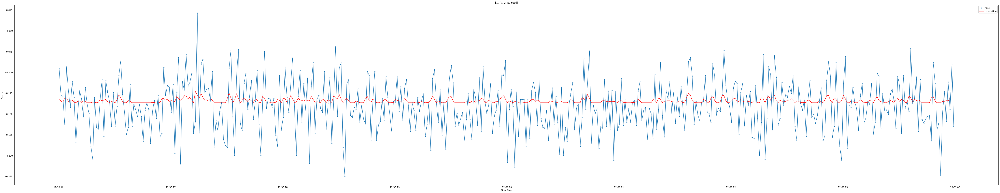

2 [2, 2, 10, 200]


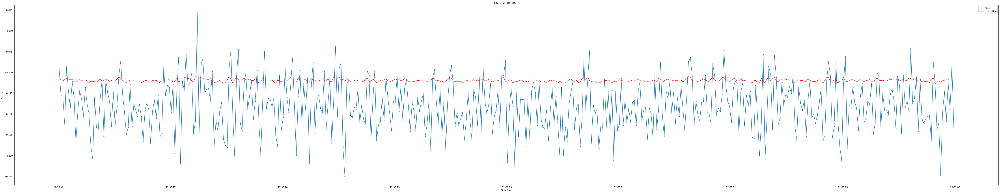

3 [2, 2, 10, 300]


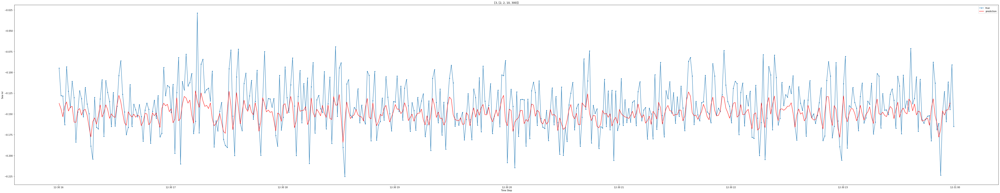

4 [2, 2, 20, 200]


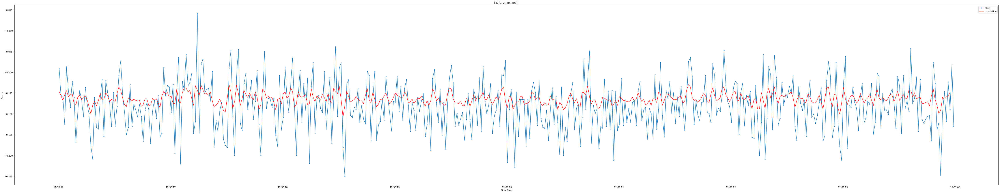

5 [2, 2, 20, 300]


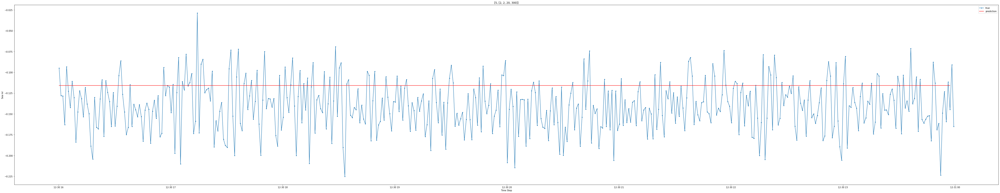

6 [2, 3, 5, 200]


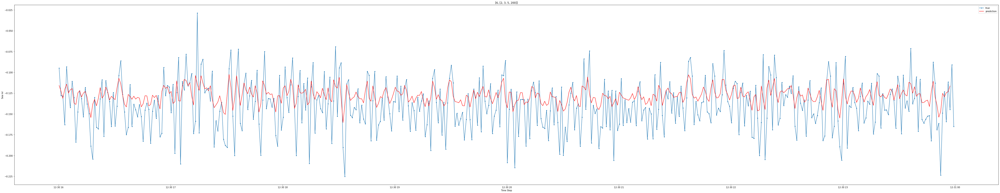

7 [2, 3, 5, 300]


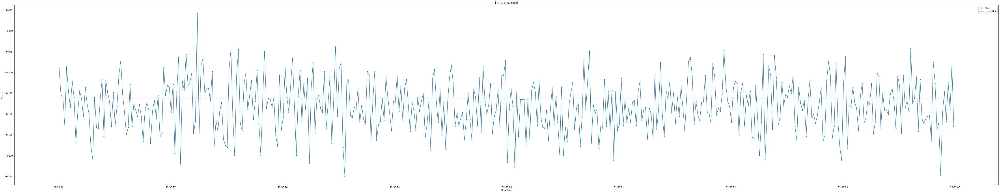

8 [2, 3, 10, 200]


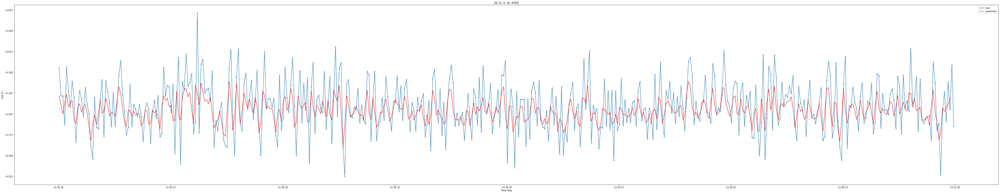

9 [2, 3, 10, 300]


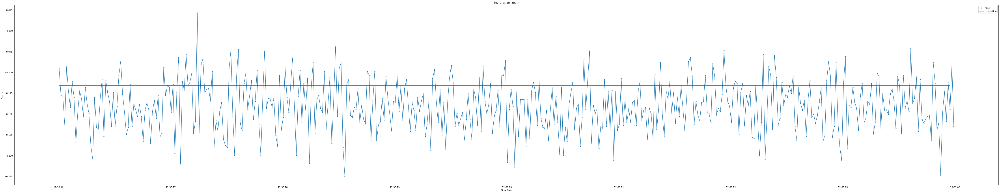

10 [2, 3, 20, 200]


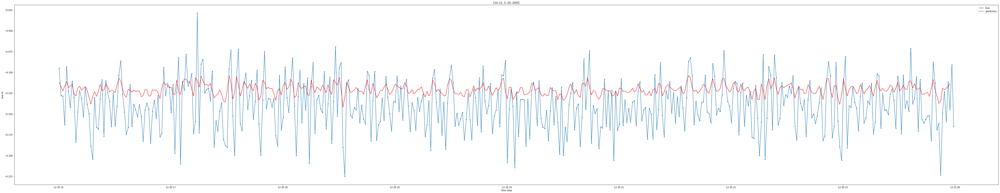

11 [2, 3, 20, 300]


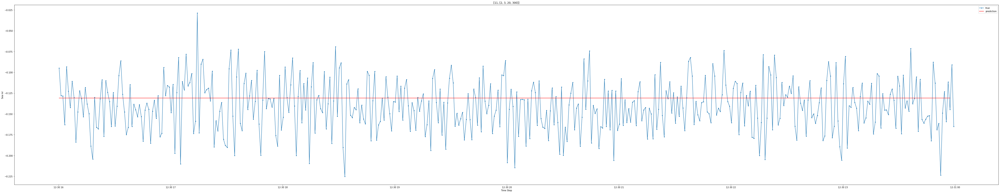

12 [3, 2, 5, 200]


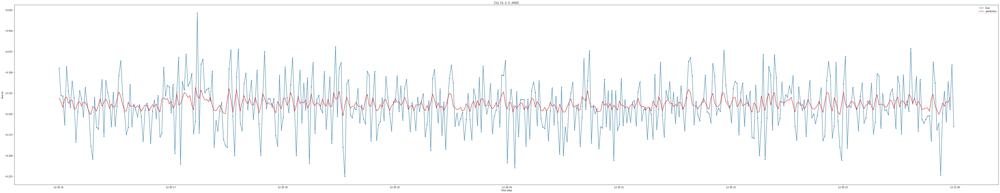

13 [3, 2, 5, 300]


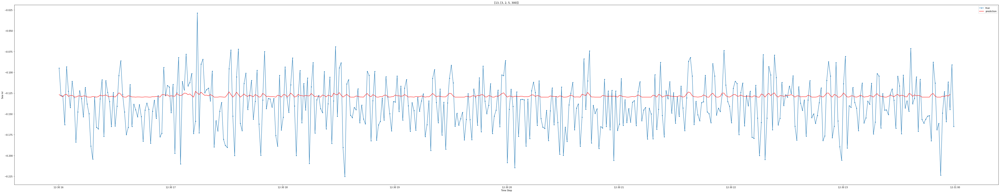

14 [3, 2, 10, 200]


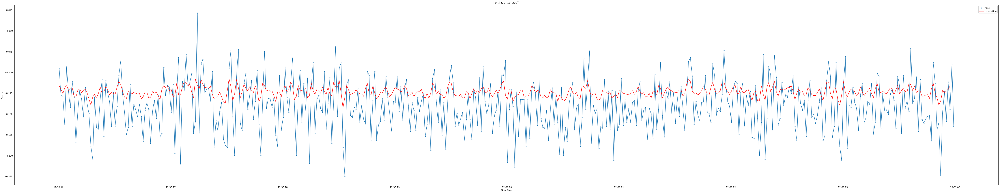

15 [3, 2, 10, 300]


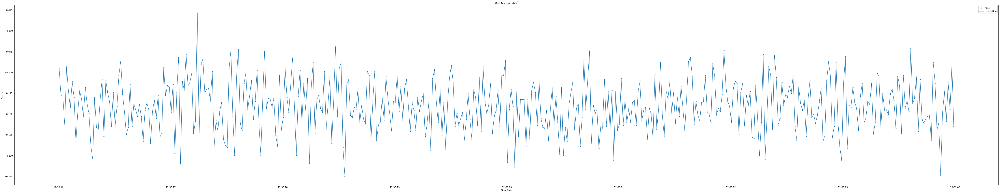

16 [3, 2, 20, 200]


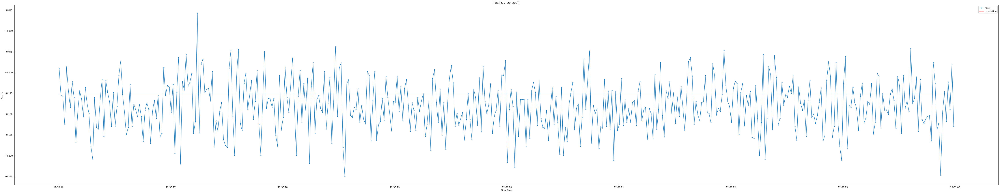

17 [3, 2, 20, 300]


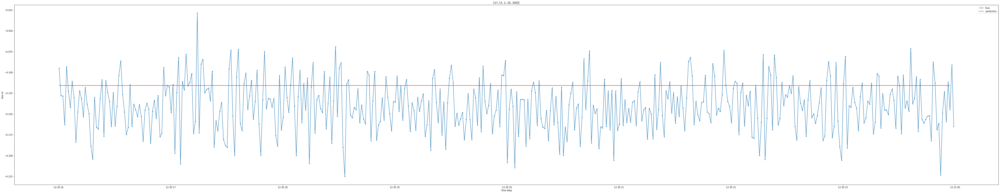

18 [3, 3, 5, 200]


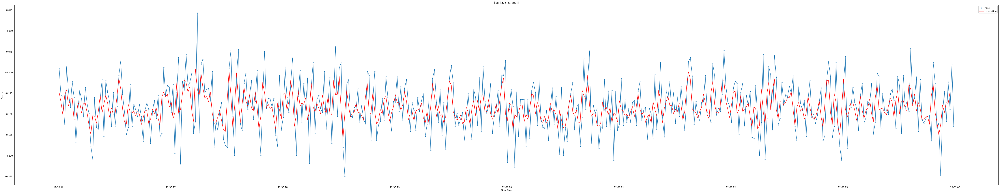

19 [3, 3, 5, 300]


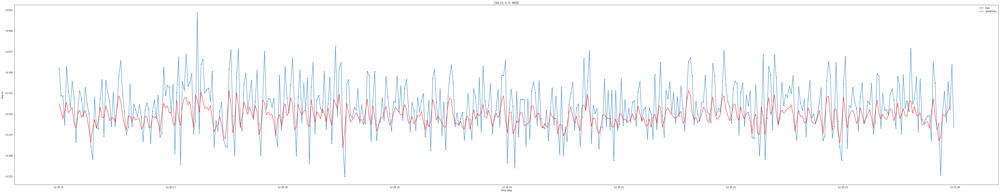

20 [3, 3, 10, 200]


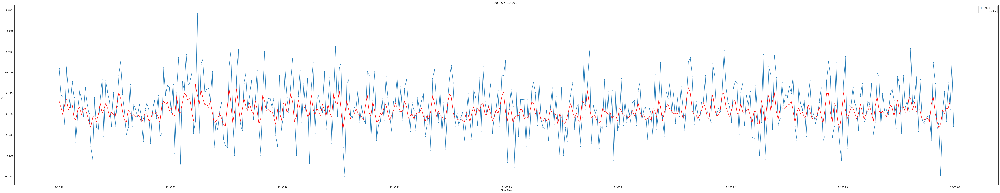

21 [3, 3, 10, 300]


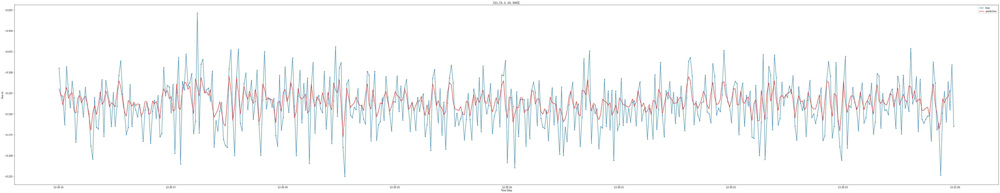

22 [3, 3, 20, 200]


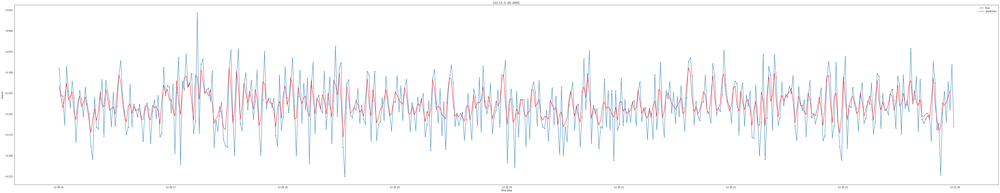

23 [3, 3, 20, 300]


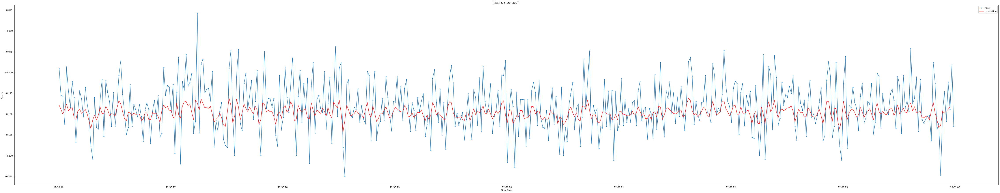

In [158]:
plt.rcParams["figure.figsize"] = (80,15)

for i in range(len(configs_lst)):
    dfp = pd.read_csv('predictions'+ str(i + 1) +'.csv',sep=',', header=0, index_col=0, squeeze=True, parse_dates=True)
    print(i, configs_lst[i])
    if configs_lst[i][2] >0:
        fig = plt.figure()
        fig.patch.set_facecolor('xkcd:white')
        plt.title(label = [i, configs_lst[i]])
        
        plt.plot(pdates, test, marker='.', label="true")
        plt.plot(dfp.shift(periods=-2), 'r', label="prediction")
        plt.ylabel('Sea lvl')
        plt.xlabel('Time Step')
        plt.legend()
        plt.show();


In [148]:
utptest = utptest.reshape(utptest.shape[0], )

In [155]:
test = test.reshape(test.shape[0])

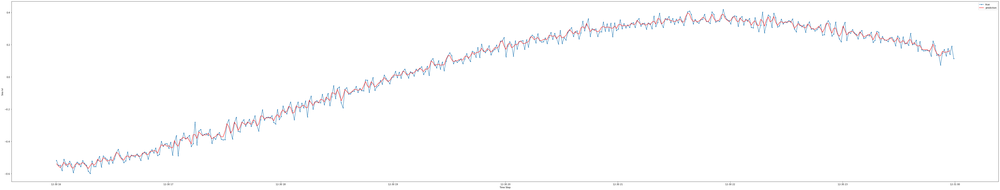

In [159]:
i=22
dfp = pd.read_csv('predictions'+ str(i + 1) +'.csv',sep=',', header=0, index_col=0, squeeze=True, parse_dates=True)

fig = plt.figure()
fig.patch.set_facecolor('xkcd:white')

plt.plot(pdates, test + utptest, marker='.', label="true")
plt.plot(dfp.shift(periods=-2)+ utptest, 'r', label="prediction")
plt.ylabel('Sea lvl')
plt.xlabel('Time Step')
plt.legend()
plt.show();